In [1]:
from rdkit import Chem
import numpy as np
from rdkit.Chem import DataStructs, rdMolDescriptors, rdFingerprintGenerator, SDWriter
import random
from rdkit.Chem import Draw
from Bio.PDB.MMCIFParser import MMCIFParser
from Bio.PDB import MMCIFParser, PDBIO, Structure, Model, Chain, Residue
import json
import os
import py3Dmol
import glob
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import csv
import openbabel

# Liczymy podobieństwa inhibitorów

Zapisane w kolejności:
- **avibactam**: NC(=O)[C@@H]1CC[C@@H]2CN1C(=O)N2OS(=O)(=O)O
- **imipenem**: C[C@@H](O)[C@H]1C(=O)N2C(C(=O)O)=C(SCCNC=N)C[C@H]12
- **meropenem**: C[C@@H](O)[C@H]1C(=O)N2C(C(=O)O)=C(S[C@@H]3CN[C@H](C(=O)N(C)C)C3)[C@H](C)[C@H]12


In [2]:
#inhibitory w smiles
inhibitor_smiles = [
    "NC(=O)[C@@H]1CC[C@@H]2CN1C(=O)N2OS(=O)(=O)O",
    "C[C@@H](O)[C@H]1C(=O)N2C(C(=O)O)=C(SCCNC=N)C[C@H]12",
    "C[C@@H](O)[C@H]1C(=O)N2C(C(=O)O)=C(S[C@@H]3CN[C@H](C(=O)N(C)C)C3)[C@H](C)[C@H]12"
]

inhibitors = [Chem.MolFromSmiles(smiles) for smiles in inhibitor_smiles]

inhibitor_fps = [rdMolDescriptors.GetMACCSKeysFingerprint(mol) for mol in inhibitors]

similarity_matrix = np.zeros((len(inhibitor_fps), len(inhibitor_fps)))

for i in range(len(inhibitor_fps)):
    for j in range(i, len(inhibitor_fps)):  
        similarity = DataStructs.TanimotoSimilarity(inhibitor_fps[i], inhibitor_fps[j])
        similarity_matrix[i, j] = similarity
        similarity_matrix[j, i] = similarity 

print("Macierz podobieństwa między inhibitorami:")
for i in range(len(inhibitor_smiles)):
    for j in range(len(inhibitor_smiles)):
        print(f"{similarity_matrix[i, j]:.3f}", end="\t")
    print()


Macierz podobieństwa między inhibitorami:
1.000	0.462	0.440	
0.462	1.000	0.768	
0.440	0.768	1.000	


Widzimy, że imipenem i meropenem są do siebie bardziej podobne (0.768), niż do avibactamu (około 0.4).

# Łączenie biblioteki potencjalnych związków
Kolejne pliki zawierają związki podobne do:
- CC(C)(O/N=C(\C(=O)N[C@@H]1C(=O)N2C(C(=O)[O-])=C(C[n+]3ccccc3)CS[C@H]12)c1csc(N)n1)C(=O)O
- CO/N=C(\C(=O)N[C@@H]1C(=O)N2C(C(=O)[O-])=C(C[N+]3(C)CCCC3)CS[C@H]12)c1csc(N)n1
- Nc1nc(/C(=N/O)C(=O)N[C@@H]2C(=O)N3C(C(=O)O)=C(/C=C4\CCN([C@@H]5CCNC5)C4=O)CS[C@H]23)ns1

W dwóch pierwszych po około 2000 związków, a w ostatnim 600.

Wynikowo dostajemy 2260 związków zapisanych w pliku 'polaczone_bialka_3D.sdf'.

In [3]:
# Generator fingerprintów Morgana z radius=3
gen = rdFingerprintGenerator.GetMorganGenerator(radius=3)

# Wczytanie plików SDF 3D
sdf_files = ["compounds_3D\plik1.sdf", "compounds_3D\plik2.sdf", "compounds_3D\plik3.sdf"]
all_molecules = []
seen_fps = set()

# Wczytanie cząsteczki z plików SDF
for sdf_file in sdf_files:
    supplier = Chem.SDMolSupplier(sdf_file)
    for mol in supplier:
        if mol is not None:
            fp = gen.GetFingerprint(mol)  # Generowanie fingerprintu Morgana
            fp_bytes = fp.ToBinary()  # Konwersja fingerprintu do bajtów (porównywanie)

            # Sprawdzanie, czy fingerprint już występuje
            if fp_bytes not in seen_fps:
                seen_fps.add(fp_bytes)
                all_molecules.append(mol)

# Zapisywanie unikalnych cząsteczek do nowego pliku SDF
output_writer = SDWriter("polaczone_bialka_3D.sdf")
for mol in all_molecules:
    output_writer.write(mol)
output_writer.close()

print(f"Połączono i zapisano {len(all_molecules)} unikalnych cząsteczek do pliku 'polaczone_bialka_3D.sdf'")

Połączono i zapisano 2260 unikalnych cząsteczek do pliku 'polaczone_bialka_3D.sdf'


# Przykładowe związki

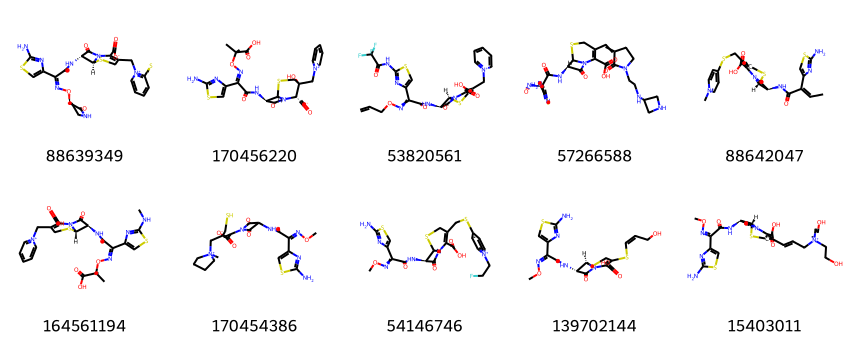

In [4]:
supplier = Chem.SDMolSupplier("polaczone_bialka_3D.sdf")
no_none=[mol for mol in supplier if mol]
[Chem.SanitizeMol(mol) for mol in no_none]
random_mols = random.sample(no_none, min(10, len(no_none)))
Draw.MolsToGridImage(random_mols, molsPerRow=5,subImgSize=(170,170),legends=[mol.GetProp('_Name') for mol in random_mols],maxMols=100)

# Sprawdzanie podobieństw związków
Z pliku 'polaczone_bialka_3D.sdf' sprawdzamy ich podobieństwa do naszych inhibitorów. Ma to nam ułatwić wybór struktury krystalicznej KPC-2.
Manipulując wyborem prawdopodobieństw tylko większych od danej wartości możemy sprawdzić ile jest związków bardzo podobnych. (np.where)

In [5]:
def calculate_similarity(sim_val, protein_sdf="polaczone_bialka_3D.sdf"):
    proteins = Chem.SDMolSupplier(protein_sdf)

    inhibitors = {
        "avibactam": "NC(=O)[C@@H]1CC[C@@H]2CN1C(=O)N2OS(=O)(=O)O",
        "imipenem": "C[C@@H](O)[C@H]1C(=O)N2C(C(=O)O)=C(SCCNC=N)C[C@H]12",
        "meropenem": "C[C@@H](O)[C@H]1C(=O)N2C(C(=O)O)=C(S[C@@H]3CN[C@H](C(=O)N(C)C)C3)[C@H](C)[C@H]12"
    }

    inhibitor_mols = {name: Chem.MolFromSmiles(smiles) for name, smiles in inhibitors.items()}

    # Fingerprinty inhibitorów
    inhibitor_fps = {name: rdMolDescriptors.GetMACCSKeysFingerprint(mol) for name, mol in inhibitor_mols.items()}
    protein_fps = [rdMolDescriptors.GetMACCSKeysFingerprint(mol) for mol in proteins if mol is not None]

    similarity_scores = []
    
    for name, inhibitor_fp in inhibitor_fps.items():
        similarities = np.array([DataStructs.TanimotoSimilarity(inhibitor_fp, protein_fp) for protein_fp in protein_fps])
        num_before = len(similarities)
        filtered_similarities = similarities[np.where(similarities > sim_val)]
        
        num_similarities = len(filtered_similarities)
        avg_similarity = np.mean(filtered_similarities) if num_similarities > 0 else 0
        
        similarity_scores.append((name, avg_similarity, num_similarities, num_before))

    # Sortowanie według średniego podobieństwa
    similarity_scores.sort(key=lambda x: x[1], reverse=True)

    for i, (name, avg_sim, num_sim, num_b) in enumerate(similarity_scores):
        if i == 1:
            print(f"Liczba związków przed filtracją: {num_b}")
        print(f"{i+1}. Inhibitor: {name}, Średnie podobieństwo: {avg_sim:.5f}, Liczba związków z podobieństwem > {sim_val}: {num_sim}")

    # Najlepszy inhibitor
    best_inhibitor = similarity_scores[0]
    print(f"\nNajlepiej dopasowany inhibitor: {best_inhibitor[0]} (Podobieństwo: {best_inhibitor[1]:.3f}, Liczba związków z podobieństwem > {sim_val}: {best_inhibitor[2]})")


In [6]:
calculate_similarity(0.58)

1. Inhibitor: avibactam, Średnie podobieństwo: 0.60556, Liczba związków z podobieństwem > 0.58: 46
Liczba związków przed filtracją: 2260
2. Inhibitor: imipenem, Średnie podobieństwo: 0.60449, Liczba związków z podobieństwem > 0.58: 775
3. Inhibitor: meropenem, Średnie podobieństwo: 0.59430, Liczba związków z podobieństwem > 0.58: 177

Najlepiej dopasowany inhibitor: avibactam (Podobieństwo: 0.606, Liczba związków z podobieństwem > 0.58: 46)


In [7]:
calculate_similarity(0.55)

1. Inhibitor: imipenem, Średnie podobieństwo: 0.58520, Liczba związków z podobieństwem > 0.55: 1487
Liczba związków przed filtracją: 2260
2. Inhibitor: avibactam, Średnie podobieństwo: 0.57056, Liczba związków z podobieństwem > 0.55: 256
3. Inhibitor: meropenem, Średnie podobieństwo: 0.56926, Liczba związków z podobieństwem > 0.55: 847

Najlepiej dopasowany inhibitor: imipenem (Podobieństwo: 0.585, Liczba związków z podobieństwem > 0.55: 1487)


In [8]:
calculate_similarity(0.5)

1. Inhibitor: imipenem, Średnie podobieństwo: 0.56801, Liczba związków z podobieństwem > 0.5: 2219
Liczba związków przed filtracją: 2260
2. Inhibitor: meropenem, Średnie podobieństwo: 0.54571, Liczba związków z podobieństwem > 0.5: 2077
3. Inhibitor: avibactam, Średnie podobieństwo: 0.53185, Liczba związków z podobieństwem > 0.5: 1244

Najlepiej dopasowany inhibitor: imipenem (Podobieństwo: 0.568, Liczba związków z podobieństwem > 0.5: 2219)


Dostosowując wartości zmiennej sim_val możemy manipulować ilością związków jakie zostają do liczenia średniej. Potencjalne dostosowanie rozmiaru biblioteki do dokowania.

# Zapis do pliku mol2
Dla wybranej wartości podobieństwa i wybranego inhibitora można zapisać plik zawierający wybrane związki.
Analiza wcześniejszej funckji pozwala zauważyć dla jakich wartości jaki rozmiar biblioteki otrzymamy i zdecydować się na wybór ostatecznego inhibitora i wielkości biblioteki.

Możliwość ustawienia dodania wodorów przed zapisem.

In [9]:
def save_similar_proteins(sim_val, inhibitor_name, output_file="filtered_proteins.mol2", add_H = False, protein_sdf="polaczone_bialka_3D.sdf"):
    # Wczytanie białek z pliku SDF
    proteins = Chem.SDMolSupplier(protein_sdf)
    
    # Zdefiniowanie inhibitorów i ich SMILES
    inhibitors = {
        "avibactam": "NC(=O)[C@@H]1CC[C@@H]2CN1C(=O)N2OS(=O)(=O)O",
        "imipenem": "C[C@@H](O)[C@H]1C(=O)N2C(C(=O)O)=C(SCCNC=N)C[C@H]12",
        "meropenem": "C[C@@H](O)[C@H]1C(=O)N2C(C(=O)O)=C(S[C@@H]3CN[C@H](C(=O)N(C)C)C3)[C@H](C)[C@H]12"
    }

    # Sprawdzenie, czy wybrany inhibitor jest dostępny w słowniku
    if inhibitor_name not in inhibitors:
        raise ValueError(f"Inhibitor o nazwie '{inhibitor_name}' nie został znaleziony w słowniku.")
    
    # Pobranie SMILES dla wybranego inhibitora
    inhibitor_smiles = inhibitors[inhibitor_name]
    
    # Tworzenie molekuły inhibitora z SMILES
    inhibitor_mol = Chem.MolFromSmiles(inhibitor_smiles)
    
    # Tworzenie fingerprinta dla inhibitora
    inhibitor_fp = rdMolDescriptors.GetMACCSKeysFingerprint(inhibitor_mol)
    
    # Obliczanie fingerprintów dla białek
    protein_fps = [rdMolDescriptors.GetMACCSKeysFingerprint(mol) for mol in proteins if mol is not None]

    # Obliczanie podobieństwa Tanimoto między inhibitorem a białkami
    similarities = np.array([DataStructs.TanimotoSimilarity(inhibitor_fp, protein_fp) for protein_fp in protein_fps])

    # Filtracja białek, których podobieństwo do inhibitora jest większe niż sim_val
    filtered_proteins = [protein for i, protein in enumerate(proteins) if similarities[i] > sim_val]

    # Zapisanie filtracji białek do pliku .mol2
    mol_writer = Chem.SDWriter(output_file)
    
    for protein in filtered_proteins:
        if protein is not None:
            if add_H:
                # Dodanie atomów wodoru do białka
                protein = Chem.AddHs(protein)
            mol_writer.write(protein)

    mol_writer.close()

    print(f"Zapisano {len(filtered_proteins)} białka do pliku: {output_file}")

In [10]:
save_similar_proteins(0.55, 'imipenem', "filtered_proteins.mol2")

Zapisano 1487 białka do pliku: filtered_proteins.mol2


Użyjemy do dokowania tych z dodanym wodorem.

In [11]:
save_similar_proteins(0.55, 'imipenem', "filtered_proteins_with_H.sdf", True)

Zapisano 1487 białka do pliku: filtered_proteins_with_H.sdf


# Milestone 2

In [12]:
# Ścieżki do plików
cif_file = "8RWR.cif"  # Plik mmCIF
pdb_file = "8RWR.pdb"  # Nazwa pliku wyjściowego PDB

# Parsowanie pliku mmCIF
parser = MMCIFParser()
structure = parser.get_structure("KPC2", cif_file)

# Zapisanie w formacie PDB
io = PDBIO()
io.set_structure(structure)
io.save(pdb_file)

print(f"Plik {cif_file} został przekonwertowany do {pdb_file}")


Plik 8RWR.cif został przekonwertowany do 8RWR.pdb


In [13]:
def extract_and_remove_ligands(structure, ligand_names=["A1H3N"]):
    
    ligand_coords = {}  # Słownik do przechowywania współrzędnych ligandów
    ligand_found = {ligand_name: False for ligand_name in ligand_names}  # Śledzenie, które ligandy zostały znalezione
    
    for ligand_name in ligand_names:
        ligand_coords[ligand_name] = []
    
    for model in structure:  # Iteracja po modelach w strukturze
        for chain in list(model):  # Iteracja po łańcuchach
            for residue in list(chain):  # Iteracja po resztach
                # Sprawdzenie, czy nazwa reszty odpowiada jednemu z ligandów
                if residue.get_resname() in ligand_names:
                    # Wyodrębnienie współrzędnych przed usunięciem
                    ligand_name = residue.get_resname()
                    ligand_found[ligand_name] = True
                    residue_coords = []
                    for atom in residue:
                        residue_coords.append(atom.get_coord().tolist())  # Pobranie współrzędnych atomu
                    
                    ligand_coords[ligand_name].extend(residue_coords)
                    
                    # Usunięcie ligandu z łańcucha
                    chain.detach_child(residue.get_id())
    
    # Oblicz środek geometryczny każdego ligandu
    ligand_centers = {}
    for ligand_name, coords in ligand_coords.items():
        if coords:
            ligand_centers[ligand_name] = np.mean(coords, axis=0).tolist()
        else:
            ligand_centers[ligand_name] = None
    
    # Wypisz ostrzeżenie, jeśli jakiś ligand nie został znaleziony
    not_found = [name for name, found in ligand_found.items() if not found]
    if not_found:
        print(f"Ostrzeżenie: Nie znaleziono następujących ligandów: {', '.join(not_found)}")
    
    return ligand_coords, ligand_centers


In [14]:
def process_structure(cif_file, ligands_to_remove, box_size=[20, 20, 20]):    
    
    # Sprawdzenie, czy plik istnieje
    if not os.path.exists(cif_file):
        print(f"Błąd: Plik {cif_file} nie został znaleziony.")
        return None, None, None
    
    # Parsowanie pliku CIF
    parser = MMCIFParser()
    try:
        structure = parser.get_structure("model", cif_file)
    except Exception as e:
        print(f"Błąd podczas parsowania pliku: {e}")
        return None, None, None
    
    # Wyodrębnienie współrzędnych i usunięcie ligandów
    ligand_coords, ligand_centers = extract_and_remove_ligands(structure, ligands_to_remove)
    
    # Nazwy plików wynikowych na podstawie nazwy wejściowego pliku
    base_name = os.path.splitext(cif_file)[0]
    pdb_out = f"{base_name}_no_ligands.pdb"
    coords_out = f"{base_name}_ligand_coordinates.json"
    config_out = f"{base_name}_docking_config.txt"
    
    # Zapis zmodyfikowanej struktury do pliku PDB
    io = PDBIO()
    io.set_structure(structure)
    io.save(pdb_out)
    print(f"Zapisano zmodyfikowaną strukturę do pliku {pdb_out}")
    
    # Zapis współrzędnych i środków ligandów do pliku JSON
    with open(coords_out, "w") as f:
        json.dump({"coordinates": ligand_coords, "centers": ligand_centers}, f, indent=4)
    print(f"Zapisano współrzędne ligandów do pliku {coords_out}")
    
    # Wyświetlenie środków ligandów do wykorzystania przy dokowaniu
    print("\nŚrodki ligandów do dokowania:")
    for ligand_name, center in ligand_centers.items():
        if center:  # Tylko jeśli znaleziono współrzędne
            print(f"{ligand_name}: {center[0]:.3f}, {center[1]:.3f}, {center[2]:.3f}")
        else:
            print(f"{ligand_name}: Brak współrzędnych")
    
    # Generowanie pliku konfiguracyjnego do dokowania
    with open(config_out, "w") as f:
        f.write("# Konfiguracja dokowania wygenerowana na podstawie współrzędnych ligandów\n\n")
        for ligand_name, center in ligand_centers.items():
            if center:
                f.write(f"# Miejsce wiązania dla {ligand_name}\n")
                f.write(f"center_x = {center[0]:.3f}\n")
                f.write(f"center_y = {center[1]:.3f}\n")
                f.write(f"center_z = {center[2]:.3f}\n")
                f.write(f"size_x = {box_size[0]}\n")
                f.write(f"size_y = {box_size[1]}\n")
                f.write(f"size_z = {box_size[2]}\n\n")
    print(f"Zapisano konfigurację dokowania do pliku {config_out}")
    
    return pdb_out, coords_out

In [15]:
cif_file = "8RWR.cif"  # Plik mmCIF ze strukturą KPC-2 z imipenemem
ligands_to_remove = ["A1H3N", "A1H3O", "SO4", "GOL", "HOH"]  # Usunięcie imipenemu i cząsteczek wody
box_size = [20, 20, 20]  # Rozmiar boksu do dokowania w Angstremach
pdb_file, coords_file = process_structure(cif_file, ligands_to_remove, box_size)


Zapisano zmodyfikowaną strukturę do pliku 8RWR_no_ligands.pdb
Zapisano współrzędne ligandów do pliku 8RWR_ligand_coordinates.json

Środki ligandów do dokowania:
A1H3N: 16.453, 8.054, 20.688
A1H3O: 17.007, 8.735, 21.015
SO4: 25.528, 17.456, 5.434
GOL: 25.550, 30.835, 10.667
HOH: 13.806, 17.013, 14.097
Zapisano konfigurację dokowania do pliku 8RWR_docking_config.txt


Optymalny rozmiar box dla A1H3N

In [16]:
# Wczytanie struktury
parser = MMCIFParser()
structure = parser.get_structure("KPC2", "8RWR.cif")

# Znalezienie wszystkich atomów imipenemu
ligand_atoms = []
for model in structure:
    for chain in model:
        for residue in chain:
            if residue.get_resname() == "A1H3N":
                for atom in residue:
                    ligand_atoms.append(atom.get_coord())

# Obliczenie środka masy
center = np.mean(ligand_atoms, axis=0)

# Obliczenie promienia (maksymalna odległość od środka)
max_distance = max([np.linalg.norm(atom - center) for atom in ligand_atoms])

# Ustawienie box_size z marginesem 6Å
box_size = [2 * (max_distance + 6)] * 3

print(f"Centrum boxu: {center}")
print(f"Optymalny box_size: {box_size}")


Centrum boxu: [16.452658  8.053578 20.688263]
Optymalny box_size: [24.76620864868164, 24.76620864868164, 24.76620864868164]


Optymalny rozmiar box dla A1H3O

In [17]:
# Wczytanie struktury
parser = MMCIFParser()
structure = parser.get_structure("KPC2", "8RWR.cif")

# Znalezienie wszystkich atomów imipenemu
ligand_atoms = []
for model in structure:
    for chain in model:
        for residue in chain:
            if residue.get_resname() == "A1H3O":
                for atom in residue:
                    ligand_atoms.append(atom.get_coord())

# Obliczenie środka masy
center = np.mean(ligand_atoms, axis=0)

# Obliczenie promienia (maksymalna odległość od środka)
max_distance = max([np.linalg.norm(atom - center) for atom in ligand_atoms])

# Ustawienie box_size z marginesem 6Å
box_size = [2 * (max_distance + 6)] * 3

print(f"Centrum boxu: {center}")
print(f"Optymalny box_size: {box_size}")


Centrum boxu: [17.006659  8.735476 21.01518 ]
Optymalny box_size: [23.828917503356934, 23.828917503356934, 23.828917503356934]


### Wizualizacja po usunięciu ligandów

In [18]:
with open("8RWR_no_ligands.pdb") as f:
    protein_data = f.read()
view = py3Dmol.view(width=800, height=600)
view.addModel(protein_data, "pdb")
view.setStyle({'cartoon': {'color': 'spectrum'}})
view.setStyle({'hetflag': True}, {'stick': {}})
view.zoomTo()
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

### Wizualizacja przed usunięciem ligandów

In [19]:
with open("8RWR.pdb") as f:
    protein_data = f.read()
view = py3Dmol.view(width=800, height=600)
view.addModel(protein_data, "pdb")
view.setStyle({'cartoon': {'color': 'spectrum'}})
view.setStyle({'hetflag': True}, {'stick': {}})
view.zoomTo()
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Zapis współrzednych potrzebnych do dokowania.

In [20]:
# Współrzędne centroidów z pliku konfiguracyjnego
centroid_A1H3N = np.array([16.453, 8.054, 20.688])
centroid_A1H3O = np.array([17.007, 8.735, 21.015])

# Obliczenie średniej centroidy
avg_centroid = np.mean([centroid_A1H3N, centroid_A1H3O], axis=0)
print(f"Średni centroid: {avg_centroid}")

# Ustawienie stałego rozmiaru box_size = 24
box_size = 24.0

# Zapis do pliku
output_file = "8RWR_optimal_docking_config.txt"
with open(output_file, "w") as f:
    f.write("# Optymalny box dokowania wygenerowany na podstawie A1H3N i A1H3O\n\n")
    f.write(f"center_x = {avg_centroid[0]:.3f}\n")
    f.write(f"center_y = {avg_centroid[1]:.3f}\n")
    f.write(f"center_z = {avg_centroid[2]:.3f}\n")
    f.write(f"size_x = {box_size}\n")
    f.write(f"size_y = {box_size}\n")
    f.write(f"size_z = {box_size}\n")

print(f"Zapisano konfigurację do pliku: {output_file}")
print(f"Rozmiar boksu: {box_size} Å")


Średni centroid: [16.73    8.3945 20.8515]
Zapisano konfigurację do pliku: 8RWR_optimal_docking_config.txt
Rozmiar boksu: 24.0 Å


Przygotowanie Białka KPC-2 do Dokowania Molekularnego

- ```obabel 8RWR_no_ligands.pdb -O 8RWR_withH.pdb -h``` - wywołane w konsoli anaconda w celu dodania wodorów do białka wyjściowy plik to 8RWR_withH.pdb
- ```obabel 8RWR_withH.pdb -O 8RWR_receptor.pdbqt -xr --partialcharge gasteiger``` - wywołane w konsoli anaconda w celu przekonwertowania struktury białka do formatu PDBQT i dodania ładunków

Naszym targetem jest plik 8RWR_receptor.pdbqt.

Następnie zapisujemy ligandy jako pdbqt również z konsoli: 
- ```filtered_proteins_with_H.sdf -O ligand_.pdbqt -m -xl```
- 1487 molecules converted
- 1487 files output. The first is ligand_1.pdbqt

Zapisujemy ligandy także jako oddzielne pliki sdf również z konsoli: 
- ```filtered_proteins_with_H.sdf -O ligand_.sdf -m```
- 1487 molecules converted
- 1487 files output. The first is ligand_1.pdbqt

W celu usprawnienia pracy folder z ligandami podzieliłyśmy na 10 części. Poniższy kod do dokowania wywołuje dla każdej z 10 części pętlę dokowania. (należy zmieniać nazwy parts_1 na kolejne).

**Dokowanie za pomocą smina.**
```
@echo off
setlocal enabledelayedexpansion

for %%f in (ligands\part_1\*.pdbqt) do ( 
    set "ligand=%%f"
    set "base=%%~nf"
    smina -r 8RWR_receptor.pdbqt ^
        -l "!ligand!" ^
        --center_x 16.730 --center_y 8.395 --center_z 20.852 ^
        --size_x 24.0 --size_y 24.0 --size_z 24.0 ^
        --exhaustiveness 8 ^
        --num_modes 20 ^
        --energy_range 3 ^
        -o results\!base!_out.pdbqt ^
        --log results\!base!.log
)
```

Wybierzemy związki po najniższym affiniti i niskim odchyleniu affinity w 10 zwracanych wartościach.

## Wczytanie wyników dokowania

### Funkcje obsługi plików

Poniższe funkcje zostały uruchomione lokalnie na naszych komputerach, w oparciu o wyniki dokowania wygenerowane z poziomu konsoli. Zrezygnowano z umieszczania tysięcy plików wynikowych na GitHubie, dlatego w repozytorium znajduje się jedynie gotowy plik merged_affinities.txt. Funkcje zostały jednak dołączone, aby umożliwić pełne odtworzenie przeprowadzonych przez czynności.

In [21]:
# Ładuje wyniki dokowania (tylko interesujące nas affinities) oraz zapisuje w słowniku
def load_affinities_from_logs(folder_path='results'):
    affinities = {}
    for filepath in glob.glob(os.path.join(folder_path, 'ligand_*.log')):
        filename = os.path.basename(filepath).split('.')[0]
        ligand_name = filename

        with open(filepath, 'r') as f:
            lines = f.readlines()

        for idx, line in enumerate(lines):
            if line.strip().startswith("mode |   affinity"):
                start_idx = idx + 2
                break
        else:
            print(f"Nie znaleziono nagłówka w pliku {filepath}.")
            continue

        ligand_affinity = []
        for line in lines[start_idx:]:
            if not line.strip():
                break
            parts = line.split()
            if len(parts) < 3:
                continue
            try:
                affinity = float(parts[1])
                ligand_affinity.append(affinity)
            except ValueError:
                continue

        affinities[ligand_name] = ligand_affinity
    return affinities

In [22]:
# Zapis słownika do pliku txt
def save_affinities_to_txt(affinities, filename):
    with open(filename, 'w') as f:
        for ligand, values in affinities.items():
            line = ligand + ' ' + ' '.join(map(str, values)) + '\n'
            f.write(line)

In [23]:
#łączy różne pliki z affinities do jednego pliku
def merge_affinities_files(input_files, output_file):
    merged_affinities = {}
    
    for file in input_files:
        with open(file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if not parts:
                    continue
                ligand = parts[0]
                values = list(map(float, parts[1:]))
                if ligand in merged_affinities:
                    merged_affinities[ligand].extend(values)
                else:
                    merged_affinities[ligand] = values
    
    with open(output_file, 'w') as f:
        for ligand, values in merged_affinities.items():
            line = ligand + ' ' + ' '.join(map(str, values)) + '\n'
            f.write(line)

In [24]:
# Mając jeden plik z affinities, można go wczytać i przetworzyć
def load_affinities_from_txt(filename):
    affinities = {}
    with open(filename, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if not parts:
                continue  # pomiń puste linie
            ligand = parts[0]
            try:
                values = list(map(float, parts[1:]))
            except ValueError:
                print(f"Błąd konwersji w linii: {line.strip()}")
                continue
            affinities[ligand] = values
    return affinities

### Ładowanie danych dokowania z results

In [25]:
#affinities=load_affinities_from_logs()

### Zapis do pliku tekstowego

In [26]:
# filename = 'affinities1.txt' 
# save_affinities_to_txt(affinities, filename)

### Łączenie plików tekstowych zawierających częściowe wyniki dokowania do jednego pliku txt

In [27]:
# Lista nazw plików do łączenia
# Nasze wyniki były rozbite na 2 pliki, które trzeba było połączyć
# name_list = ['affinities1.txt', 'affinities2.txt']
# merge_affinities_files(name_list, 'merged_affinities.txt')

### Załadowanie pliku tekstowego do ostatecznej analizy

In [28]:
affinities = load_affinities_from_txt('merged_affinities.txt')

### Analiza

Rozmiar biblioteki do dokowania.

In [29]:
len(affinities.keys())

1428

Słowniki dla odchylenia standardowego i wartości minimalnej w affinities dla każdej ligandy.

In [30]:
standard_deviation = {}
for key in affinities.keys():
    standard_deviation[key] = np.std(affinities[key])

In [31]:
# Wybieramy 140 ligand o najmniejszym odchyleniu standardowym
smallest_140_sd = dict(sorted(standard_deviation.items(), key=lambda item: item[1])[:140])

In [32]:
min_value_for_min_sd = {}
for key in smallest_140_sd.keys():
    min_value_for_min_sd[key] = np.min(affinities[key])

In [33]:
# Początkowo wybrane 140 po najmniejszym odchyleniu standardowym a później 20 z tych o najmniejszej wartosci minimalnej
smallest_20 = dict(sorted(min_value_for_min_sd.items(), key=lambda item: item[1])[:20])
print("Ostateczne 20 ligandów o najmniejszym odchyleniu standardowym i minimalnej wartości affinity:")
print(smallest_20.keys())
print(smallest_20.values())

Ostateczne 20 ligandów o najmniejszym odchyleniu standardowym i minimalnej wartości affinity:
dict_keys(['ligand_2', 'ligand_287', 'ligand_115', 'ligand_156', 'ligand_404', 'ligand_147', 'ligand_113', 'ligand_117', 'ligand_249', 'ligand_1151', 'ligand_325', 'ligand_136', 'ligand_555', 'ligand_259', 'ligand_1153', 'ligand_927', 'ligand_547', 'ligand_466', 'ligand_164', 'ligand_1475'])
dict_values([-8.7, -8.5, -8.4, -8.4, -8.4, -8.3, -8.3, -8.2, -8.2, -8.2, -8.2, -8.2, -8.1, -8.1, -8.1, -8.1, -8.1, -8.1, -8.1, -8.1])


Histogram odchylenia standardowego w affinities

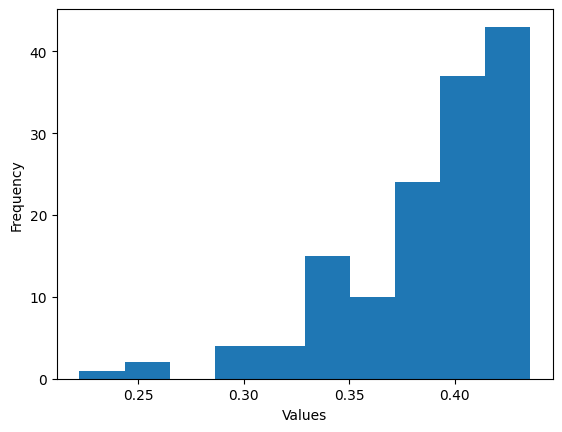

In [34]:
plt.hist(smallest_140_sd.values())
plt.xlabel("Values")
plt.ylabel("Frequency")
plt.show()

Histogram wartości minimalnej dla wybranych 140 ligandów o najmniejszym odchyleniu standardowym. 

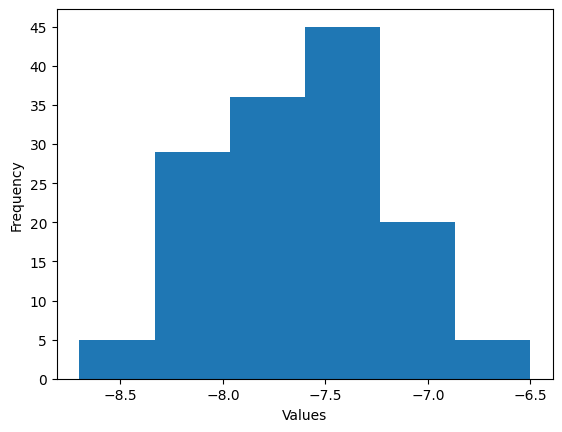

In [35]:
plt.hist(min_value_for_min_sd.values(), bins = 6)
plt.xlabel("Values")
plt.ylabel("Frequency")
ax = plt.gca()
ax.yaxis.set_major_locator(ticker.MultipleLocator(5))  

plt.show()

Czyli wybrane 20 ligand ma odchylenie standardowe na poziomie około 0.4 oraz wartość minimalną około -8.5.

In [36]:
input_file = "merged_affinities.txt"
output_file = "filtered_affinities.csv"

with open(input_file, "r") as infile, open(output_file, "w", newline='') as outfile:
    writer = csv.writer(outfile)
    writer.writerow(["Ligand", "Affinities", "Min_Affinity", "Std_Dev"])

    for line in infile:
        parts = line.strip().split()
        if not parts:
            continue
        ligand_name = parts[0]
        if ligand_name in smallest_20:
            try:
                affinities = list(map(float, parts[1:]))
                min_affinity = min(affinities)
                std_dev = round(np.std(affinities), 4)

                writer.writerow([
                    ligand_name,
                    " ".join(map(str, affinities)),
                    min_affinity,
                    std_dev
                ])
            except ValueError:
                print(f"Błąd w konwersji liczb dla liganda {ligand_name}")


W folderze ligands i results znajdują się tylko wybrane przez nas ligandy przed i po dokowaniu.

Poniżej znajduje się wizualizacja wybranych 20 ligand.

Wizualizacja samych ligand

In [37]:
ligand_names = smallest_20.keys()

for name in ligand_names:
    file_path = f'ligands/{name}.pdbqt'
    try:
        with open(file_path, 'r') as f:
            pdbqt_data = f.read()
        print(f"Wizualizacja: {name}")

        viewer = py3Dmol.view(width=400, height=300)
        viewer.addModel(pdbqt_data, 'pdbqt')
        viewer.setStyle({'stick': {}})
        viewer.setBackgroundColor('white')
        viewer.zoomTo()
        viewer.show()


    except FileNotFoundError:
        print(f"Plik nie znaleziony: {file_path}")

Wizualizacja: ligand_2


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_287


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_115


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_156


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_404


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_147


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_113


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_117


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_249


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_1151


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_325


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_136


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_555


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_259


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_1153


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_927


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_547


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_466


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_164


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja: ligand_1475


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wybraliśmy także inny ligand, który mimo nieco większego odchylenia, posiada małe minimum – wprowadza to urozmaicenie do naszego zestawu.

In [38]:
file_path = f'ligands/ligand_980.pdbqt'
try:
    with open(file_path, 'r') as f:
        pdbqt_data = f.read()

    viewer = py3Dmol.view(width=400, height=300)
    viewer.addModel(pdbqt_data, 'pdbqt')
    viewer.setStyle({'stick': {}})
    viewer.setBackgroundColor('white')
    viewer.zoomTo()
    viewer.show()
except FileNotFoundError:
    print(f"Plik nie znaleziony: {file_path}")

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Wizualizacja ligand z receptorem

In [39]:
receptor_path = '8RWR_receptor.pdbqt'

def show_complex(ligand_name):
    with open(receptor_path) as f:
        rec_data = f.read()
    with open(f'results/{ligand_name}_out.pdbqt') as f:
        lig_data = f.read()
    viewer = py3Dmol.view(width=600, height=400)
    viewer.addModel(rec_data, 'pdbqt')
    viewer.setStyle({'model': 0}, {'cartoon': {'color': 'lightblue'}})
    viewer.addModel(lig_data, 'pdbqt')
    viewer.setStyle({'model': 1}, {'stick': {'colorscheme': 'greenCarbon'}})
    viewer.zoomTo()
    viewer.show()

for ligand_name in ligand_names:
    print(ligand_name)
    show_complex(ligand_name)

ligand_2


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_287


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_115


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_156


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_404


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_147


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_113


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_117


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_249


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_1151


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_325


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_136


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_555


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_259


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_1153


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_927


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_547


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_466


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_164


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

ligand_1475


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Do dynamiki wybrałyśmy 5 następujących ligandów:  
- ligand_115,-8.4 -8.1 -7.9 -7.9 -7.8 -7.7 -7.7 -7.7 -7.7 -7.7 -7.6 -7.4 -7.4 -7.4 -7.3 -7.3 -7.2 -7.1 -7.1 -7.0, MIN:-8.4, STD: 0.3509
- ligand_927,-8.1 -8.1 -8.0 -7.9 -7.9 -7.8 -7.7 -7.7 -7.6 -7.6 -7.5 -7.4 -7.4 -7.2 -7.2 -7.0 -7.0 -7.0 -6.9 -6.8, MIN: -8.1, STD: 0.4048
- ligand_980,-10.0 -8.3 -8.1 -8.0 -7.6 -7.5 -7.5 -7.5 -7.5 -7.4 -7.3 -7.2 -7.2 -7.2 -7.1 -7.1, MIN: -10.0, STD: 0.6964
- ligand_287,-8.5 -8.4 -8.0 -8.0 -8.0 -8.0 -7.8 -7.8 -7.8 -7.7 -7.6 -7.5 -7.4 -7.4 -7.4 -7.3 -7.3 -7.2 -7.0, MIN: -8.5, STD: 0.3905
- ligand_113,-8.3 -8.1 -8.0 -8.0 -7.9 -7.8 -7.8 -7.8 -7.7 -7.6 -7.5 -7.5 -7.5 -7.4 -7.4 -7.2 -7.1 -7.0 -6.9 -6.9, MIN: -8.3, STD: 0.3951

Projekt ten stanowi punkt wyjścia do dalszych analiz, takich jak symulacje dynamiki molekularnej.

## Analiza ADMET

Po dokowaniu przeprowadziłyśmy analizę właściwości farmakokinetycznych (ADMET – Absorpcja, Dystrybucja, Metabolizm, Wydalanie, Toksyczność) wybranych 5 ligand korzystając ze strony https://admet.ai.greenstonebio.com/.

### Ligand nr 113: PubChem ID 25056706  
SMILES: CC(C)(C(=O)O)O/N=C(/C1=CSC(=N1)N)\C(=O)N[C@H]2C3N(C2=O)C(=C(CS3)CSC4=NC(=CS4)C[N+]5=CC=CC6=C5CCC6)C(=O)O

Toksyczność:  
- hERG = 0.28 – umiarkowane ryzyko sercowe  
- AMES = 0.11 – niskie ryzyko mutagenności  
- DILI = 0.89 – wysokie ryzyko uszkodzenia wątroby  

Wchłanianie:  
- HIA = 0.19 – słabe wchłanianie przez jelita  
- Biodostępność = 0.27 – mała część leku trafi do krwi  
- PAMPA = 0.07 – lek nie przechodzi dobrze przez błony komórkowe  

Dystrybucja:  
- BBB = 0.19 – lek nie przechodzi do mózgu  
- PPB = 68.36 – lek umiarkowanie dobrze wiąże się z białkami  
- VDSS = 3.69 – lek szeroko rozprzestrzenia się po organizmie  

Half-life = 15.23 – średni czas działania  
Umiarkowane wiązanie z CYP – mniejsze ryzyko interakcji lekowych  

### Ligand nr 115: PubChem ID 44137025  
SMILES: CC(C)(C(=O)O)O/N=C(/C1=CSC(=N1)N)\C(=O)N[C@H]2[C@@H]3N(C2=O)C(=C(CS3)SC4=NC(=CS4)C[N+]5=CC=CC6=C5CCC6)C(=O)O

Toksyczność:  
- hERG = 0.22 – umiarkowane ryzyko sercowe  
- AMES = 0.14 – niskie ryzyko mutagenności  
- DILI = 0.9 – wysokie ryzyko uszkodzenia wątroby  

Wchłanianie:  
- HIA = 0.1 – słabe wchłanianie przez jelita  
- Biodostępność = 0.24 – mała część leku trafi do krwi  
- PAMPA = 0.05 – lek nie przechodzi dobrze przez błony komórkowe  

Dystrybucja:  
- BBB = 0.19 – lek nie przechodzi do mózgu  
- PPB = 67.31 – umiarkowane wiązanie z białkami  
- VDSS = 3.6 – szeroka dystrybucja w organizmie  

Half-life = 17.59 – średni czas działania  
Umiarkowane wiązanie z CYP  

### Ligand nr 287: PubChem ID 57278977  
SMILES: C=CCON=C(C1=CSC(=N1)NC=O)C(=O)NC2[C@H]3N(C2=O)C(=C(CS3)CSC=CC4=CN=CC=C4)C(=O)O

Toksyczność:  
- hERG = 0.11 – niskie ryzyko sercowe  
- AMES = 0.02 – bardzo niskie ryzyko mutagenności  
- DILI = 0.98 – bardzo wysokie ryzyko uszkodzenia wątroby  

Wchłanianie:  
- HIA = 0.47 – umiarkowane wchłanianie  
- Biodostępność = 0.46 – średnia  
- PAMPA = 0.15 – słabe przenikanie przez błony  

Dystrybucja:  
- BBB = 0.13 – lek nie przechodzi do mózgu  
- PPB = 79.01 – dobre wiązanie z białkami  
- VDSS = 2.98 – szeroka dystrybucja  

Half-life = 20.46 – średni czas działania  
Umiarkowane wiązanie z CYP  

### Ligand nr 927: PubChem ID 88339242  
SMILES: CC(=O)NCC1=NN=C(S1)SCC2=C(N3[C@H](C(C3=O)NC(=O)C(=NOC)C4=CSC(=N4)N)SC2)C(=O)O

Toksyczność:  
- hERG = 0.06 – bardzo niskie ryzyko sercowe  
- AMES = 0.03 – bardzo niskie ryzyko mutagenności  
- DILI = 0.97 – bardzo wysokie ryzyko uszkodzenia wątroby  

Wchłanianie:  
- HIA = 0.1 – niskie wchłanianie  
- Biodostępność = 0.39 – średnia  
- PAMPA = 0.04 – słabe przenikanie przez błony  

Dystrybucja:  
- BBB = 0.18 – lek nie przechodzi do mózgu  
- PPB = 63.63 – umiarkowane wiązanie z białkami  
- VDSS = 0 – bardzo słaba dystrybucja  

Half-life = 0 – bardzo krótki czas działania  
Niskie wiązanie z CYP  

### Ligand nr 980: PubChem ID 88420547  
SMILES: CN1C=CC=C2C1SC(=N2)SCC3=C(N4[C@@H](C(C4=O)NC(=O)/C(=N\OC)/C5=CSC(=N5)N)SC3)C(=O)O

Toksyczność:  
- hERG = 0.07 – bardzo niskie ryzyko sercowe  
- AMES = 0.03 – bardzo niskie ryzyko mutagenności  
- DILI = 0.98 – bardzo wysokie ryzyko uszkodzenia wątroby  

Wchłanianie:  
- HIA = 0.42 – umiarkowane  
- Biodostępność = 0.44 – średnia  
- PAMPA = 0.09 – słabe przenikanie  

Dystrybucja:  
- BBB = 0.15 – lek nie przechodzi do mózgu  
- PPB = 74.93 – dobre wiązanie z białkami  
- VDSS = 0 – bardzo słaba dystrybucja  

Half-life = 0 – bardzo krótki czas działania  
Umiarkowane wiązanie z CYP

### Podsumowanie

Wszystkie ligandy wykazują wysokie ryzyko uszkodzenia wątroby (DILI). Dwa pierwsze mają nieco większą toksyczność, pozostałe bardzo niską. Wchłanianie większości ligandów jest średnie, ale ligandy 287 i 980 wyróżniają się wyższymi wartościami HIA i biodostępności. Żaden ligand nie przenika przez barierę krew-mózg, co może być korzystne ze względu na ograniczenie działań niepożądanych w OUN. Ligandy 113, 115 i 287 charakteryzują się szeroką dystrybucją, natomiast 927 i 980 mają ograniczone rozprzestrzenianie w organizmie. Czas półtrwania jest najkorzystniejszy dla ligandu 287.

Z tego względu najlepszym kandydatem do dalszych badań wydaje się **ligand 287**, pomimo ryzyka związanego z DILI.


### Imipenem (lek porównawczy)

Toksyczność:  
- hERG = 0  
- AMES = 0.03  
- DILI = 0.56  

Wchłanianie:  
- HIA = 0.36  
- Biodostępność = 0.57  
- PAMPA = 0.01  

Dystrybucja:  
- BBB = 0.07  
- PPB = 26.49  
- VDSS = 1.86  

Half-life = 0  
Niskie wiązanie z CYP